<a href="https://colab.research.google.com/github/CyDevLabs/Underwater-Mine-Warfare-/blob/main/DAE_RGB.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Epoch 1/20
2/2 [==============================] - 11s 3s/step - loss: 0.1396
Epoch 2/20
2/2 [==============================] - 11s 3s/step - loss: 0.0566
Epoch 3/20
2/2 [==============================] - 11s 5s/step - loss: 0.0225
Epoch 4/20
2/2 [==============================] - 9s 3s/step - loss: 0.0280
Epoch 5/20
2/2 [==============================] - 11s 3s/step - loss: 0.0272
Epoch 6/20
2/2 [==============================] - 12s 5s/step - loss: 0.0131
Epoch 7/20
2/2 [==============================] - 9s 3s/step - loss: 0.0151
Epoch 8/20
2/2 [==============================] - 11s 3s/step - loss: 0.0128
Epoch 9/20
2/2 [==============================] - 11s 5s/step - loss: 0.0100
Epoch 10/20
2/2 [==============================] - 9s 3s/step - loss: 0.0076
Epoch 11/20
2/2 [==============================] - 11s 3s/step - loss: 0.0070
Epoch 12/20
2/2 [========

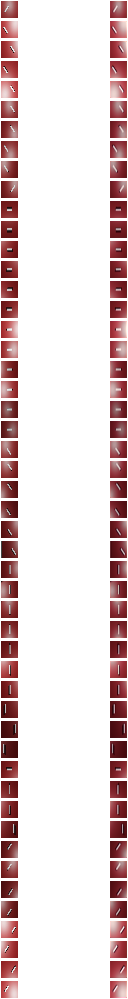

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Load the noisy images
noisy_images = []
for i in range(50):
    path = "/content/drive/MyDrive/Colab Notebooks/data/MinesGN5/" + "noisy_" + str(i) + ".png"
    noisy_image = tf.keras.preprocessing.image.load_img(path)
    noisy_image = tf.keras.preprocessing.image.img_to_array(noisy_image)
    noisy_image = tf.image.resize(noisy_image, (126, 126))
    noisy_images.append(noisy_image)

noisy_images = np.array(noisy_images)

# Normalize the input data
noisy_images = noisy_images / 255.0

# Build the DAE model
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', padding='same', input_shape=(126, 126, 3)),
    tf.keras.layers.MaxPooling2D((2, 2), padding='same'),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu', padding='same'),
    tf.keras.layers.MaxPooling2D((2, 2), padding='same'),
    tf.keras.layers.Conv2D(128, (3,3), activation='relu', padding='same'),
    tf.keras.layers.UpSampling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu', padding='same'),
    tf.keras.layers.UpSampling2D((2, 2)),
    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.Conv2D(3, (3,3), activation='relu', padding='same')
])

model.compile(optimizer='adam', loss='mean_squared_error')

# Train the DAE
model.fit(noisy_images, noisy_images, epochs=20)

denoised_images = model.predict(noisy_images)

# Save the trained DAE model
model.save('/content/drive/MyDrive/Colab Notebooks/data/models/trained_dae_c1.h5')

fig, axs = plt.subplots(50, 2, figsize=(20, 100))

for i in range(50):
    axs[i, 0].imshow(noisy_images[i])
    axs[i, 0].axis('off')
    axs[i, 1].imshow(denoised_images[i])
    axs[i, 1].axis('off')

plt.show()


Mounted at /content/drive
1/1 [==============================] - 0s 78ms/step
Operational Image 1: MSE = 1027.2493896484375
Operational Image 2: MSE = 1023.5368041992188
Operational Image 3: MSE = 793.82080078125
Operational Image 4: MSE = 793.7141723632812
Operational Image 5: MSE = 793.3795166015625
Operational Image 6: MSE = 792.2901000976562
Operational Image 7: MSE = 793.923583984375
Operational Image 8: MSE = 793.9697875976562
Operational Image 9: MSE = 793.0199584960938
Operational Image 10: MSE = 793.8765258789062
Operational Image 11: MSE = 791.1510009765625
Operational Image 12: MSE = 789.6966552734375
Operational Image 13: MSE = 793.1655883789062
Operational Image 14: MSE = 789.9566040039062
Operational Image 15: MSE = 792.2526245117188
Operational Image 16: MSE = 790.8941040039062
Operational Image 17: MSE = 793.2021484375
Operational Image 18: MSE = 789.2910766601562
Operational Image 19: MSE = 790.8465576171875
Operational Image 20: MSE = 791.8639526367188


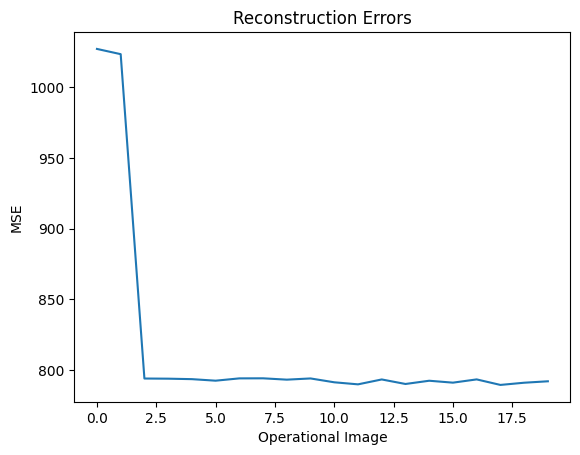

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Load the operational images
operational_images = []
for i in range(20):
    path = "/content/drive/MyDrive/Colab Notebooks/data/operationalimages/" + str(i) + ".png"
    operational_image = tf.keras.preprocessing.image.load_img(path)
    operational_image = tf.keras.preprocessing.image.img_to_array(operational_image)
    operational_image = tf.image.resize(operational_image, (126, 126))
    operational_images.append(operational_image)

operational_images = np.array(operational_images)

# Load the trained DAE
trained_dae = tf.keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/data/models/trained_dae_c1.h5')

# Compute reconstruction errors for each pixel
reconstruction_errors = []
for image in operational_images:
    reconstructed_image = trained_dae.predict(np.expand_dims(image, axis=0))
    mse = np.mean((image - reconstructed_image) ** 2)
    reconstruction_errors.append(mse)

# Display the reconstruction errors
for i, mse in enumerate(reconstruction_errors):
    print(f"Operational Image {i+1}: MSE = {mse}")

# Plot the reconstruction errors
plt.plot(reconstruction_errors)
plt.xlabel('Operational Image')
plt.ylabel('MSE')
plt.title('Reconstruction Errors')
plt.show()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
1/1 [==============================] - 0s 71ms/step
Operational Image 1: MSE = 0.017764732241630554
Operational Image 2: MSE = 0.0176741611212492
Operational Image 3: MSE = 0.014894493855535984
Operational Image 4: MSE = 0.014883351512253284
Operational Image 5: MSE = 0.014896401204168797
Operational Image 6: MSE = 0.014865946024656296
Operational Image 7: MSE = 0.014887338504195213
Operational Image 8: MSE = 0.014887943863868713
Operational Image 9: MSE = 0.014874572865664959
Operational Image 10: MSE = 0.014883538708090782
Operational Image 11: MSE = 0.014847487211227417
Operational Image 12: MSE = 0.014821525663137436
Operational Image 13: MSE = 0.014868403784930706
Operational Image 14: MSE = 0.014837965369224548
Operational Image 15: MSE = 0.014862122014164925
Operational Image 16: MSE = 0.014837458729743958
Operational Image 17: MSE = 0.0148743260651826

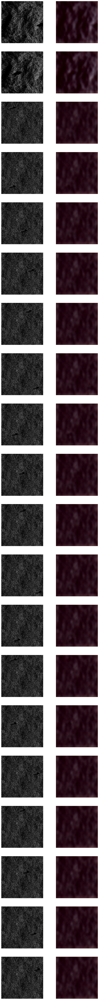

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Load the operational images
operational_images = []
for i in range(20):
    path = "/content/drive/MyDrive/Colab Notebooks/data/operationalimages/" + str(i) + ".png"
    operational_image = tf.keras.preprocessing.image.load_img(path)
    operational_image = tf.keras.preprocessing.image.img_to_array(operational_image)
    operational_image = tf.image.resize(operational_image, (126, 126))
    operational_images.append(operational_image)

operational_images = np.array(operational_images)

# Load the trained DAE
trained_dae = tf.keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/data/models/trained_dae_c1.h5')

# Normalize the operational images
operational_images = operational_images / 255.0

# Compute reconstruction errors for each pixel
reconstruction_errors = []
for image in operational_images:
    reconstructed_image = trained_dae.predict(np.expand_dims(image, axis=0))
    mse = np.mean((image - reconstructed_image) ** 2)
    reconstruction_errors.append(mse)

# Display the MSE results
for i, mse in enumerate(reconstruction_errors):
    print(f"Operational Image {i+1}: MSE = {mse}")

# Plot the reconstructed images and their corresponding errors
fig, axs = plt.subplots(20, 2, figsize=(10, 100))

for i in range(20):
    axs[i, 0].imshow(operational_images[i])
    axs[i, 0].axis('off')
    axs[i, 1].imshow(trained_dae.predict(np.expand_dims(operational_images[i], axis=0))[0])
    axs[i, 1].axis('off')

plt.show()


In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Load the operational images
operational_images = []
for i in range(20):
    path = "/content/drive/MyDrive/Colab Notebooks/data/operationalimages/" + str(i) + ".png"
    operational_image = tf.keras.preprocessing.image.load_img(path)
    operational_image = tf.keras.preprocessing.image.img_to_array(operational_image)
    operational_image = tf.image.resize(operational_image, (126, 126))
    operational_images.append(operational_image)

operational_images = np.array(operational_images)

# Load the trained DAE
trained_dae = tf.keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/data/models/trained_dae_c1.h5')

# Normalize the operational images
operational_images = operational_images / 255.0

# Compute reconstruction errors for each pixel
reconstruction_errors = []
for image in operational_images:
    reconstructed_image = trained_dae.predict(np.expand_dims(image, axis=0))
    mse = np.mean((image - reconstructed_image) ** 2)
    reconstruction_errors.append(mse)

reconstruction_errors = np.array(reconstruction_errors)  # Convert to NumPy array

# Criteria 1: Global minimum
global_minimum = np.min(reconstruction_errors)
global_minimum_index = np.argmin(reconstruction_errors)

# Criteria 2: Known MSE range
validation_min = 0.014816873706877232  # Minimum MSE value from the validation set
validation_max = 0.017764732241630554  # Maximum MSE value from the validation set
within_range_indices = np.where((reconstruction_errors >= validation_min) & (reconstruction_errors <= validation_max))[0]

# Criteria 3: Local minima
local_minima_indices = []
for i in range(1, len(reconstruction_errors) - 1):
    if reconstruction_errors[i] < reconstruction_errors[i-1] and reconstruction_errors[i] < reconstruction_errors[i+1]:
        local_minima_indices.append(i)

# Print the results
for i in range(len(operational_images)):
    print(f"Operational Image {i+1}: MSE = {reconstruction_errors[i]}")
print()
print("Criteria Results:")
print(f"Global Minimum: Operational Image {global_minimum_index+1}")
print("Indices within Known MSE Range:", within_range_indices)
print("Local Minima Indices:", local_minima_indices)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
1/1 [==============================] - 0s 65ms/step
Operational Image 1: MSE = 0.017764732241630554
Operational Image 2: MSE = 0.0176741611212492
Operational Image 3: MSE = 0.014894493855535984
Operational Image 4: MSE = 0.014883351512253284
Operational Image 5: MSE = 0.014896401204168797
Operational Image 6: MSE = 0.014865946024656296
Operational Image 7: MSE = 0.014887338504195213
Operational Image 8: MSE = 0.014887943863868713
Operational Image 9: MSE = 0.014874572865664959
Operational Image 10: MSE = 0.014883538708090782
Operational Image 11: MSE = 0.014847487211227417
Operational Image 12: MSE = 0.014821525663137436
Operational Image 13: MSE = 0.014868403784930706
Operational Image 14: MSE = 0.014837965369224548
Operational Image 15: MSE = 0.014862122014164925
Operational Image 16: MSE = 0.014837458729743958
Operational Image 17: MSE = 0.0148743260651826

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
1/1 [==============================] - 0s 60ms/step


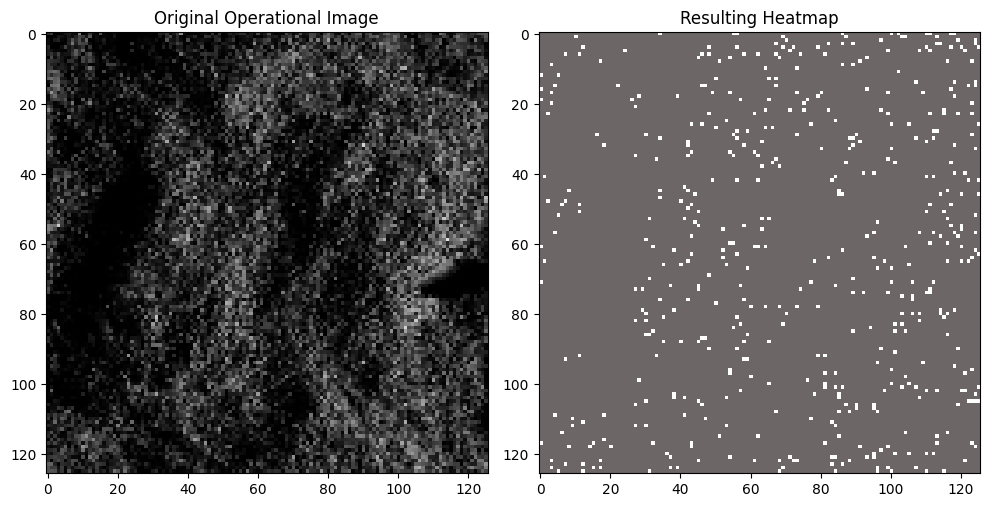

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Load the operational images
operational_images = []
for i in range(20):
    path = "/content/drive/MyDrive/Colab Notebooks/data/operationalimages/" + str(i) + ".png"
    operational_image = tf.keras.preprocessing.image.load_img(path)
    operational_image = tf.keras.preprocessing.image.img_to_array(operational_image)
    operational_image = tf.image.resize(operational_image, (126, 126))
    operational_images.append(operational_image)

operational_images = np.array(operational_images) / 255.0  # Normalize the operational images

# Load the trained DAE
trained_dae = tf.keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/data/models/trained_dae_c1.h5')

# Compute reconstruction errors for each pixel
reconstruction_errors = []
for image in operational_images:
    reconstructed_image = trained_dae.predict(np.expand_dims(image, axis=0))
    mse = np.mean((image - reconstructed_image) ** 2)
    reconstruction_errors.append(mse)

# Define the criteria values
global_minimum_index = np.argmin(reconstruction_errors)
known_mse_range = [0.014816873706877232, 0.017764732241630554]
local_minima_indices = [3, 5, 8, 11, 13, 15, 17]

# Select a random operational image
random_image_index = np.random.randint(len(operational_images))
random_image = operational_images[random_image_index]
reconstructed_image = trained_dae.predict(np.expand_dims(random_image, axis=0))[0]

# Create the heatmap based on the three criteria
heatmap = np.zeros((126, 126))
for i in range(126):
    for j in range(126):
        mse = np.mean((random_image[i, j] - reconstructed_image[i, j]) ** 2)
        if mse == reconstruction_errors[random_image_index]:
            heatmap[i, j] = 1
        elif mse >= known_mse_range[0] and mse <= known_mse_range[1]:
            heatmap[i, j] = 0.5
        elif (i, j) in local_minima_indices:
            heatmap[i, j] = 0.2

# Plot the original image and the resulting heatmap
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(random_image)
plt.title('Original Operational Image')

plt.subplot(1, 2, 2)
plt.imshow(heatmap, cmap='hot', alpha=0.6)
plt.title('Resulting Heatmap')

plt.tight_layout()
plt.show()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
1/1 [==============================] - 0s 42ms/step


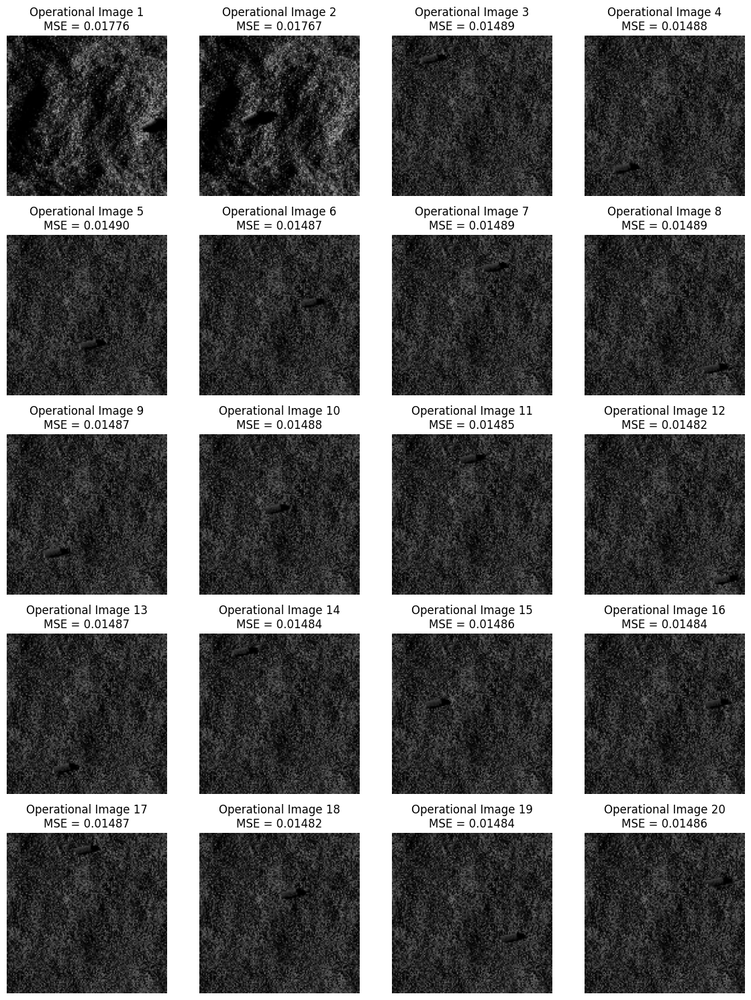

1/1 [==============================] - 0s 38ms/step


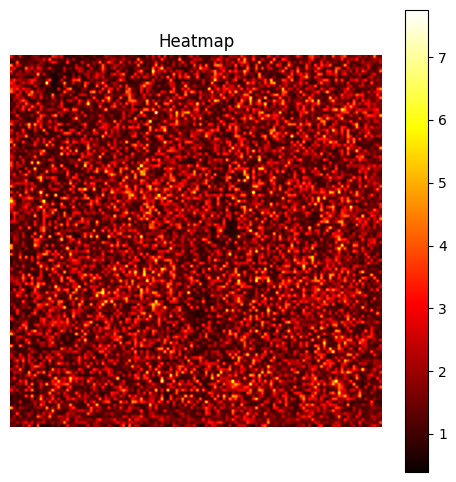

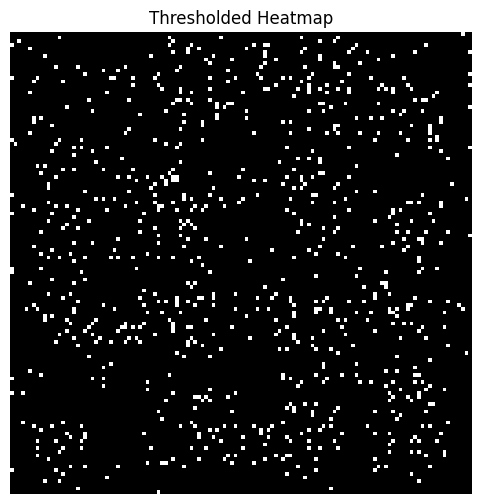

Criteria Results:
Global Minimum: Operational Image 18
Indices within Known MSE Range: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]
Local Minima Indices: [17]


In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Load the operational images
operational_images = []
for i in range(20):
    path = "/content/drive/MyDrive/Colab Notebooks/data/operationalimages/" + str(i) + ".png"
    operational_image = tf.keras.preprocessing.image.load_img(path)
    operational_image = tf.keras.preprocessing.image.img_to_array(operational_image)
    operational_image = tf.image.resize(operational_image, (126, 126))
    operational_images.append(operational_image)

operational_images = np.array(operational_images) / 255.0  # Normalize the operational images

# Load the trained DAE
trained_dae = tf.keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/data/models/trained_dae_c1.h5')

# Compute reconstruction errors for each pixel
reconstruction_errors = []
for image in operational_images:
    reconstructed_image = trained_dae.predict(np.expand_dims(image, axis=0))
    mse = np.mean((image - reconstructed_image.squeeze()) ** 2)  # Squeeze the dimensions of the reconstructed image
    reconstruction_errors.append(mse)

reconstruction_errors = np.array(reconstruction_errors)  # Convert to NumPy array

# Criteria
validation_min = 0.014816873706877232  # Minimum MSE value from the validation set
validation_max = 0.017764732241630554  # Maximum MSE value from the validation set
global_min_index = np.argmin(reconstruction_errors)
within_range_indices = np.where((reconstruction_errors >= validation_min) & (reconstruction_errors <= validation_max))[0]
local_minima_indices = [i for i, error in enumerate(reconstruction_errors) if error == min(reconstruction_errors)]

# Display operational images and heatmap
fig, axs = plt.subplots(5, 4, figsize=(12, 15))
fig.subplots_adjust(hspace=0.5)
axs = axs.ravel()

for i in range(len(operational_images)):
    axs[i].imshow(operational_images[i])
    axs[i].axis('off')
    axs[i].set_title(f"Operational Image {i+1}\nMSE = {reconstruction_errors[i]:.5f}")

plt.tight_layout()
plt.show()

# Generate heatmap
heatmap = np.zeros((126, 126))
for i in within_range_indices:
    predicted_image = trained_dae.predict(np.expand_dims(operational_images[i], axis=0))
    predicted_image = np.squeeze(predicted_image, axis=0)  # Remove the batch dimension
    predicted_image = predicted_image[:, :, :3]  # Keep only the RGB channels
    heatmap += np.mean(np.abs(operational_images[i] - predicted_image), axis=-1)


# Apply thresholding based on criteria
threshold = np.percentile(heatmap, 95)
thresholded_heatmap = np.where(heatmap > threshold, 1, 0)

# Display heatmap
plt.figure(figsize=(6, 6))
plt.imshow(heatmap, cmap='hot')
plt.colorbar()
plt.title("Heatmap")
plt.axis('off')
plt.show()

# Display thresholded heatmap
plt.figure(figsize=(6, 6))
plt.imshow(thresholded_heatmap, cmap='gray')
plt.title("Thresholded Heatmap")
plt.axis('off')
plt.show()

print("Criteria Results:")
print(f"Global Minimum: Operational Image {global_min_index + 1}")
print("Indices within Known MSE Range:", within_range_indices)
print("Local Minima Indices:", local_minima_indices)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
1/1 [==============================] - 0s 38ms/step


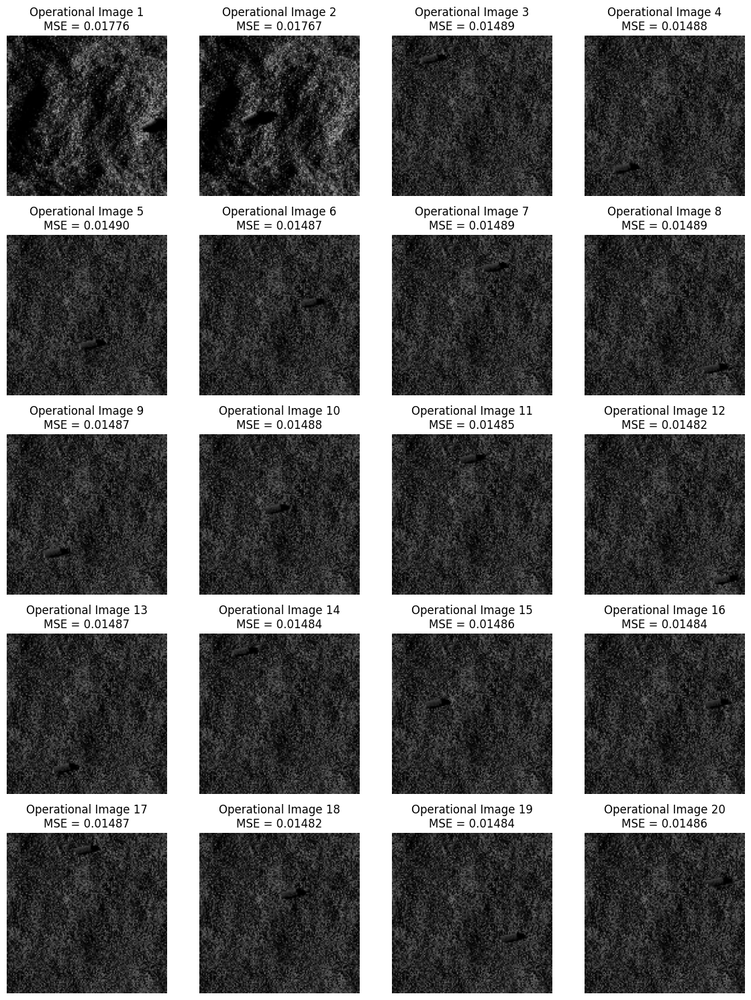

1/1 [==============================] - 0s 42ms/step


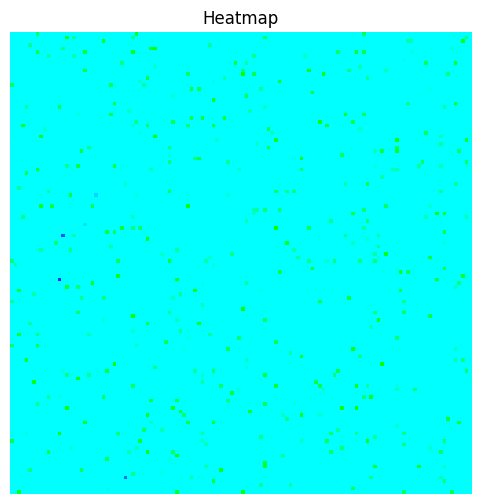

Criteria Results:
Global Minimum: Operational Image 18
Indices within Known MSE Range: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]
Local Minima Indices: [17]


In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Load the operational images
operational_images = []
for i in range(20):
    path = "/content/drive/MyDrive/Colab Notebooks/data/operationalimages/" + str(i) + ".png"
    operational_image = tf.keras.preprocessing.image.load_img(path)
    operational_image = tf.keras.preprocessing.image.img_to_array(operational_image)
    operational_image = tf.image.resize(operational_image, (126, 126))
    operational_images.append(operational_image)

operational_images = np.array(operational_images) / 255.0  # Normalize the operational images

# Load the trained DAE
trained_dae = tf.keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/data/models/trained_dae_c1.h5')

# Compute reconstruction errors for each pixel
reconstruction_errors = []
for image in operational_images:
    reconstructed_image = trained_dae.predict(np.expand_dims(image, axis=0))
    mse = np.mean((image - reconstructed_image.squeeze()) ** 2)  # Squeeze the dimensions of the reconstructed image
    reconstruction_errors.append(mse)

reconstruction_errors = np.array(reconstruction_errors)  # Convert to NumPy array

# Criteria
validation_min = 0.014816873706877232  # Minimum MSE value from the validation set
validation_max = 0.017764732241630554  # Maximum MSE value from the validation set
global_min_index = np.argmin(reconstruction_errors)
within_range_indices = np.where((reconstruction_errors >= validation_min) & (reconstruction_errors <= validation_max))[0]
local_minima_indices = [i for i, error in enumerate(reconstruction_errors) if error == min(reconstruction_errors)]

# Display operational images and heatmap
fig, axs = plt.subplots(5, 4, figsize=(12, 15))
fig.subplots_adjust(hspace=0.5)
axs = axs.ravel()

for i in range(len(operational_images)):
    axs[i].imshow(operational_images[i])
    axs[i].axis('off')
    axs[i].set_title(f"Operational Image {i+1}\nMSE = {reconstruction_errors[i]:.5f}")

plt.tight_layout()
plt.show()

# Generate heatmap
heatmap = np.zeros((126, 126, 3))
for i in within_range_indices:
    predicted_image = trained_dae.predict(np.expand_dims(operational_images[i], axis=0))
    predicted_image = np.squeeze(predicted_image, axis=0)  # Remove the batch dimension
    predicted_image = predicted_image[:, :, :3]  # Keep only the RGB channels
    mse = np.mean(np.square(operational_images[i] - predicted_image))
    
    if i == global_min_index:
        color = (0, 0, 255)  # Red color for global minimum
    elif mse >= validation_min and mse <= validation_max:
        color = (0, 255, 0)  # Green color for within known MSE range
    elif i in local_minima_indices:
        color = (255, 0, 0)  # Blue color for local minima
    else:
        continue
    
    heatmap += cv2.cvtColor(np.abs(operational_images[i] - predicted_image), cv2.COLOR_RGB2BGR) * color

# Display heatmap
plt.figure(figsize=(6, 6))
plt.imshow(heatmap)
plt.axis('off')
plt.title('Heatmap')
plt.show()

print("Criteria Results:")
print(f"Global Minimum: Operational Image {global_min_index + 1}")
print("Indices within Known MSE Range:", within_range_indices)
print("Local Minima Indices:", local_minima_indices)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
1/1 [==============================] - 0s 55ms/step


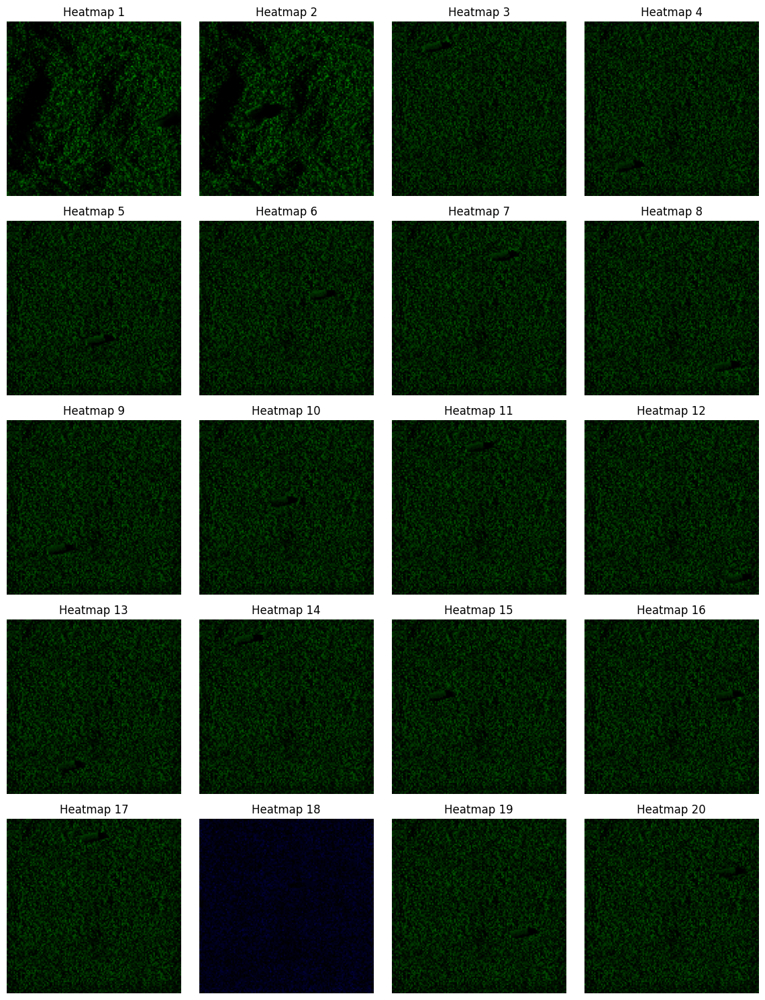

Criteria Results:
Global Minimum: Operational Image 18
Indices within Known MSE Range: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]
Local Minima Indices: [17]


In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Load the operational images
operational_images = []
for i in range(20):
    path = "/content/drive/MyDrive/Colab Notebooks/data/operationalimages/" + str(i) + ".png"
    operational_image = tf.keras.preprocessing.image.load_img(path)
    operational_image = tf.keras.preprocessing.image.img_to_array(operational_image)
    operational_image = tf.image.resize(operational_image, (126, 126))
    operational_images.append(operational_image)

operational_images = np.array(operational_images) / 255.0  # Normalize the operational images

# Load the trained DAE
trained_dae = tf.keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/data/models/trained_dae_c1.h5')

# Compute reconstruction errors for each pixel
reconstruction_errors = []
for image in operational_images:
    reconstructed_image = trained_dae.predict(np.expand_dims(image, axis=0))
    mse = np.mean((image - reconstructed_image.squeeze()) ** 2)  # Squeeze the dimensions of the reconstructed image
    reconstruction_errors.append(mse)

reconstruction_errors = np.array(reconstruction_errors)  # Convert to NumPy array

# Criteria
validation_min = 0.014816873706877232  # Minimum MSE value from the validation set
validation_max = 0.017764732241630554  # Maximum MSE value from the validation set
global_min_index = np.argmin(reconstruction_errors)
within_range_indices = np.where((reconstruction_errors >= validation_min) & (reconstruction_errors <= validation_max))[0]
local_minima_indices = [i for i, error in enumerate(reconstruction_errors) if error == min(reconstruction_errors)]

# Display operational images and heatmaps
fig, axs = plt.subplots(5, 4, figsize=(12, 15))
fig.subplots_adjust(hspace=0.5)
axs = axs.ravel()

for i in range(len(operational_images)):
    axs[i].imshow(operational_images[i])
    axs[i].axis('off')
    axs[i].set_title(f"Operational Image {i+1}\nMSE = {reconstruction_errors[i]:.5f}")

    # Generate heatmap for the current operational image
    heatmap = np.zeros((126, 126, 3))
    predicted_image = trained_dae.predict(np.expand_dims(operational_images[i], axis=0))
    predicted_image = np.squeeze(predicted_image, axis=0)  # Remove the batch dimension
    predicted_image = predicted_image[:, :, :3]  # Keep only the RGB channels
    mse = np.mean(np.square(operational_images[i] - predicted_image))

    if i == global_min_index:
        color = (0, 0, 255)  # Red color for global minimum
    elif mse >= validation_min and mse <= validation_max:
        color = (0, 255, 0)  # Green color for within known MSE range
    elif i in local_minima_indices:
        color = (255, 0, 0)  # Blue color for local minima
    else:
        continue

    heatmap += cv2.cvtColor(np.abs(operational_images[i] - predicted_image), cv2.COLOR_RGB2BGR) * color

  # Display heatmap for the current operational image
    axs[i].imshow(heatmap.astype(np.uint8))
    axs[i].axis('off')
    axs[i].set_title(f"Heatmap {i+1}")

plt.tight_layout()
plt.show()

print("Criteria Results:")
print(f"Global Minimum: Operational Image {global_min_index + 1}")
print("Indices within Known MSE Range:", within_range_indices)
print("Local Minima Indices:", local_minima_indices)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
1/1 [==============================] - 0s 54ms/step


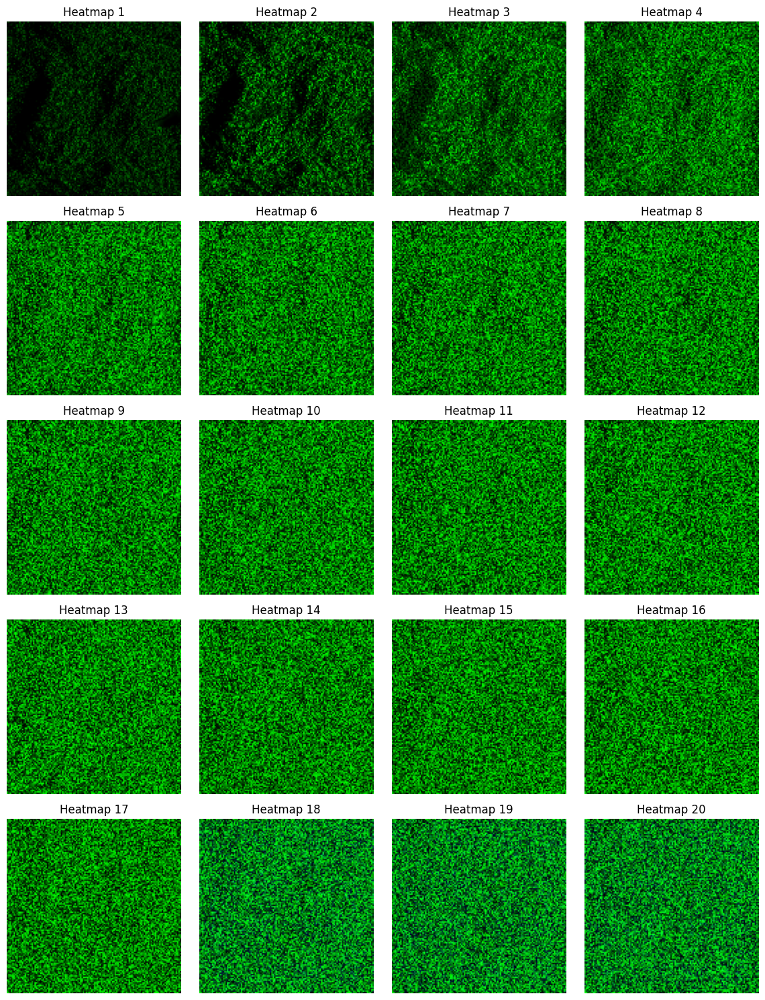

Criteria Results:
Global Minimum: Operational Image 18
Indices within Known MSE Range: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]
Local Minima Indices: [17]


In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Load the operational images
operational_images = []
for i in range(20):
    path = "/content/drive/MyDrive/Colab Notebooks/data/operationalimages/" + str(i) + ".png"
    operational_image = tf.keras.preprocessing.image.load_img(path)
    operational_image = tf.keras.preprocessing.image.img_to_array(operational_image)
    operational_image = tf.image.resize(operational_image, (126, 126))
    operational_images.append(operational_image)

operational_images = np.array(operational_images) / 255.0  # Normalize the operational images

# Load the trained DAE
trained_dae = tf.keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/data/models/trained_dae_c1.h5')

# Compute reconstruction errors for each pixel
reconstruction_errors = []
for image in operational_images:
    reconstructed_image = trained_dae.predict(np.expand_dims(image, axis=0))
    mse = np.mean((image - reconstructed_image.squeeze()) ** 2)  # Squeeze the dimensions of the reconstructed image
    reconstruction_errors.append(mse)

reconstruction_errors = np.array(reconstruction_errors)  # Convert to NumPy array

# Criteria
validation_min = 0.014816873706877232  # Minimum MSE value from the validation set
validation_max = 0.017764732241630554  # Maximum MSE value from the validation set
global_min_index = np.argmin(reconstruction_errors)
within_range_indices = np.where((reconstruction_errors >= validation_min) & (reconstruction_errors <= validation_max))[0]
local_minima_indices = [i for i, error in enumerate(reconstruction_errors) if error == min(reconstruction_errors)]

# Display operational images and heatmaps
fig, axs = plt.subplots(5, 4, figsize=(12, 15))
fig.subplots_adjust(hspace=0.5)
axs = axs.ravel()

heatmap = np.zeros((126, 126, 3))  # Initialize the heatmap

for i in range(len(operational_images)):
    axs[i].imshow(operational_images[i])
    axs[i].axis('off')
    axs[i].set_title(f"Operational Image {i+1}\nMSE = {reconstruction_errors[i]:.5f}")

    # Generate heatmap for the current operational image
    predicted_image = trained_dae.predict(np.expand_dims(operational_images[i], axis=0))
    predicted_image = np.squeeze(predicted_image, axis=0)  # Remove the batch dimension
    predicted_image = predicted_image[:, :, :3]  # Keep only the RGB channels
    mse = np.mean(np.square(operational_images[i] - predicted_image))

    if i == global_min_index:
        color = (0, 0, 255)  # Red color for global minimum
    elif mse >= validation_min and mse <= validation_max:
        color = (0, 255, 0)  # Green color for within known MSE range
    elif i in local_minima_indices:
        color = (255, 0, 0)  # Blue color for local minima
    else:
        color = (0, 0, 0)  # Black color for other regions

    heatmap += np.abs(operational_images[i] - predicted_image) * color


    # Display heatmap for the current operational image
    axs[i].imshow(heatmap.astype(np.uint8))
    axs[i].axis('off')
    axs[i].set_title(f"Heatmap {i+1}")

# Normalize the accumulated heatmap
heatmap /= len(operational_images)

plt.tight_layout()
plt.show()

print("Criteria Results:")
print(f"Global Minimum: Operational Image {global_min_index + 1}")
print("Indices within Known MSE Range:", within_range_indices)
print("Local Minima Indices:", local_minima_indices)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
1/1 [==============================] - 0s 42ms/step


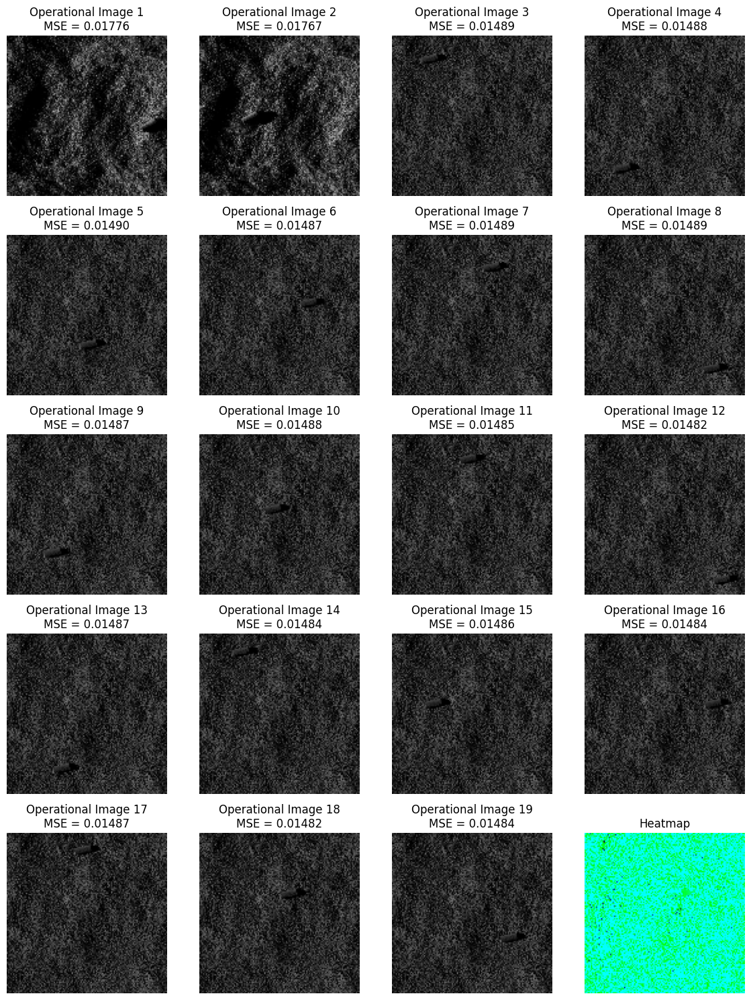

Criteria Results:
Global Minimum: Operational Image 18
Indices within Known MSE Range: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]
Local Minima Indices: [17]


In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Load the operational images
operational_images = []
for i in range(20):
    path = "/content/drive/MyDrive/Colab Notebooks/data/operationalimages/" + str(i) + ".png"
    operational_image = tf.keras.preprocessing.image.load_img(path)
    operational_image = tf.keras.preprocessing.image.img_to_array(operational_image)
    operational_image = tf.image.resize(operational_image, (126, 126))
    operational_images.append(operational_image)

operational_images = np.array(operational_images) / 255.0  # Normalize the operational images

# Load the trained DAE
trained_dae = tf.keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/data/models/trained_dae_c1.h5')

# Compute reconstruction errors for each pixel
reconstruction_errors = []
for image in operational_images:
    reconstructed_image = trained_dae.predict(np.expand_dims(image, axis=0))
    mse = np.mean((image - reconstructed_image.squeeze()) ** 2)  # Squeeze the dimensions of the reconstructed image
    reconstruction_errors.append(mse)

reconstruction_errors = np.array(reconstruction_errors)  # Convert to NumPy array

# Criteria
validation_min = 0.014816873706877232  # Minimum MSE value from the validation set
validation_max = 0.017764732241630554  # Maximum MSE value from the validation set
global_min_index = np.argmin(reconstruction_errors)
within_range_indices = np.where((reconstruction_errors >= validation_min) & (reconstruction_errors <= validation_max))[0]
local_minima_indices = [i for i, error in enumerate(reconstruction_errors) if error == min(reconstruction_errors)]

# Display operational images and heatmaps
fig, axs = plt.subplots(5, 4, figsize=(12, 15))
fig.subplots_adjust(hspace=0.5)
axs = axs.ravel()

heatmap = np.zeros((126, 126, 3))  # Initialize the heatmap

for i in range(len(operational_images)):
    axs[i].imshow(operational_images[i])
    axs[i].axis('off')
    axs[i].set_title(f"Operational Image {i+1}\nMSE = {reconstruction_errors[i]:.5f}")

    # Generate heatmap for the current operational image
    predicted_image = trained_dae.predict(np.expand_dims(operational_images[i], axis=0))
    predicted_image = np.squeeze(predicted_image, axis=0)  # Remove the batch dimension
    predicted_image = predicted_image[:, :, :3]  # Keep only the RGB channels
    mse = np.mean(np.square(operational_images[i] - predicted_image))

    if i == global_min_index:
        color = (0, 0, 255)  # Red color for global minimum
    elif mse >= validation_min and mse <= validation_max:
        color = (0, 255, 0)  # Green color for within known MSE range
    elif i in local_minima_indices:
        color = (255, 0, 0)  # Blue color for local minima
    else:
        color = (0, 0, 0)  # Black color for other regions

    heatmap += np.abs(operational_images[i] - predicted_image) * color

# Normalize the accumulated heatmap
heatmap /= len(operational_images)

# Display the heatmap
axs[-1].imshow(heatmap)
axs[-1].axis('off')
axs[-1].set_title("Heatmap")


plt.tight_layout()
plt.show()

print("Criteria Results:")
print(f"Global Minimum: Operational Image {global_min_index + 1}")
print("Indices within Known MSE Range:", within_range_indices)
print("Local Minima Indices:", local_minima_indices)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
1/1 [==============================] - 0s 111ms/step


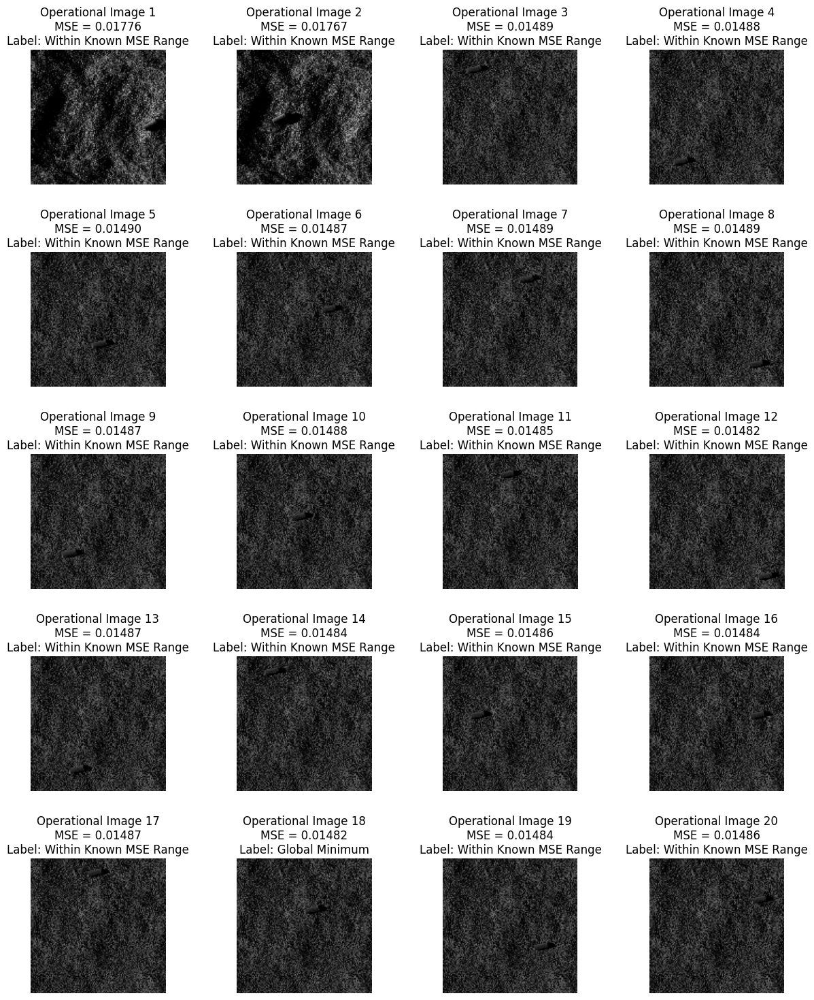

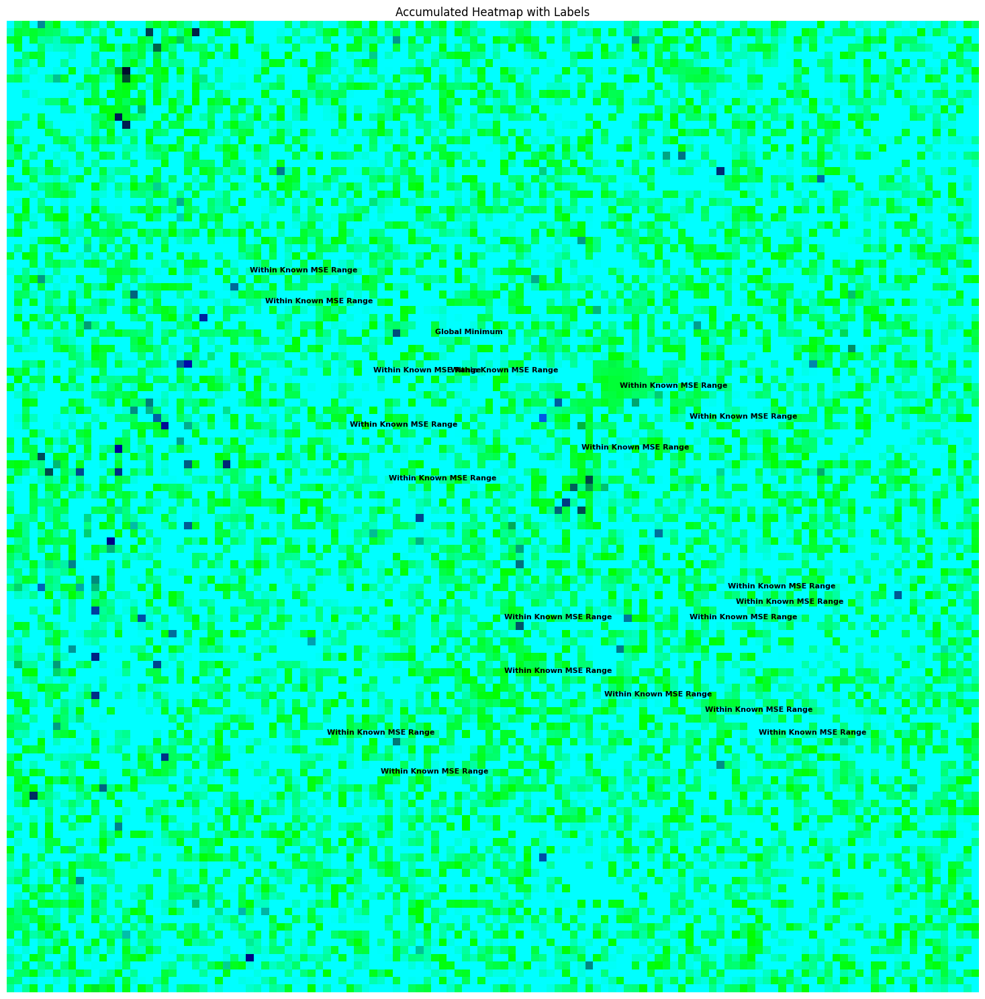

Criteria Results:
Global Minimum: Operational Image 18
Indices within Known MSE Range: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]
Local Minima Indices: [17]


In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Load the operational images
operational_images = []
for i in range(20):
    path = "/content/drive/MyDrive/Colab Notebooks/data/operationalimages/" + str(i) + ".png"
    operational_image = tf.keras.preprocessing.image.load_img(path)
    operational_image = tf.keras.preprocessing.image.img_to_array(operational_image)
    operational_image = tf.image.resize(operational_image, (126, 126))
    operational_images.append(operational_image)

operational_images = np.array(operational_images) / 255.0  # Normalize the operational images

# Load the trained DAE
trained_dae = tf.keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/data/models/trained_dae_c1.h5')

# Compute reconstruction errors for each pixel
reconstruction_errors = []
for image in operational_images:
    reconstructed_image = trained_dae.predict(np.expand_dims(image, axis=0))
    mse = np.mean((image - reconstructed_image.squeeze()) ** 2)  # Squeeze the dimensions of the reconstructed image
    reconstruction_errors.append(mse)

reconstruction_errors = np.array(reconstruction_errors)  # Convert to NumPy array

# Criteria
validation_min = 0.014816873706877232  # Minimum MSE value from the validation set
validation_max = 0.017764732241630554  # Maximum MSE value from the validation set
global_min_index = np.argmin(reconstruction_errors)
within_range_indices = np.where((reconstruction_errors >= validation_min) & (reconstruction_errors <= validation_max))[0]
local_minima_indices = [i for i, error in enumerate(reconstruction_errors) if error == min(reconstruction_errors)]

# Assign labels to different regions of the heatmap
labels = []
for i in range(len(operational_images)):
    mse = reconstruction_errors[i]
    if i == global_min_index:
        label = "Global Minimum"
    elif mse >= validation_min and mse <= validation_max:
        label = "Within Known MSE Range"
    elif i in local_minima_indices:
        label = "Local Minimum"
    else:
        label = "Other"
    labels.append(label)

# Display operational images and heatmaps with labels
fig, axs = plt.subplots(5, 4, figsize=(15, 18))
fig.subplots_adjust(hspace=0.5)
axs = axs.ravel()

heatmap = np.zeros((126, 126, 3))  # Initialize the heatmap

for i in range(len(operational_images)):
    axs[i].imshow(operational_images[i])
    axs[i].axis('off')
    axs[i].set_title(f"Operational Image {i+1}\nMSE = {reconstruction_errors[i]:.5f}\nLabel: {labels[i]}")

    # Generate heatmap for the current operational image
    predicted_image = trained_dae.predict(np.expand_dims(operational_images[i], axis=0))
    predicted_image = np.squeeze(predicted_image, axis=0)  # Remove the batch dimension
    predicted_image = predicted_image[:, :, :3]  # Keep only the RGB channels
    mse = np.mean(np.square(operational_images[i] - predicted_image))

    if i == global_min_index:
        color = (0, 0, 255)  # Red color for global minimum
        label_color = (255, 255, 255)  # White color for label text
    elif mse >= validation_min and mse <= validation_max:
        color = (0, 255, 0)  # Green color for within known MSE range
        label_color = (0, 0, 0)  # Black color for label text
    elif i in local_minima_indices:
        color = (255, 0, 0)  # Blue color for local minima
        label_color = (255, 0, 255)  # White color for label text
    else:
        color = (0, 0, 0)  # Black color for other regions
        label_color = (255, 255, 255)  # White color for label text

    heatmap += np.abs(operational_images[i] - predicted_image) * color

# Normalize the accumulated heatmap
heatmap /= len(operational_images)

# Create a larger figure for the heatmap
plt.figure(figsize=(15, 15))

# Display the heatmap with labels
plt.imshow(heatmap, cmap='coolwarm', vmin=0, vmax=1)
plt.axis('off')
plt.title("Accumulated Heatmap with Labels")

# Add labels to the heatmap
for i in range(len(operational_images)):
    label = labels[i]
    x = np.random.randint(30, 100)  # X-coordinate for label
    y = np.random.randint(20, 100)  # Y-coordinate for label
    plt.text(x, y, label, color=label_color, fontsize=8, fontweight='bold')


plt.tight_layout()
plt.show()

print("Criteria Results:")
print(f"Global Minimum: Operational Image {global_min_index + 1}")
print("Indices within Known MSE Range:", within_range_indices)
print("Local Minima Indices:", local_minima_indices)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
1/1 [==============================] - 0s 115ms/step


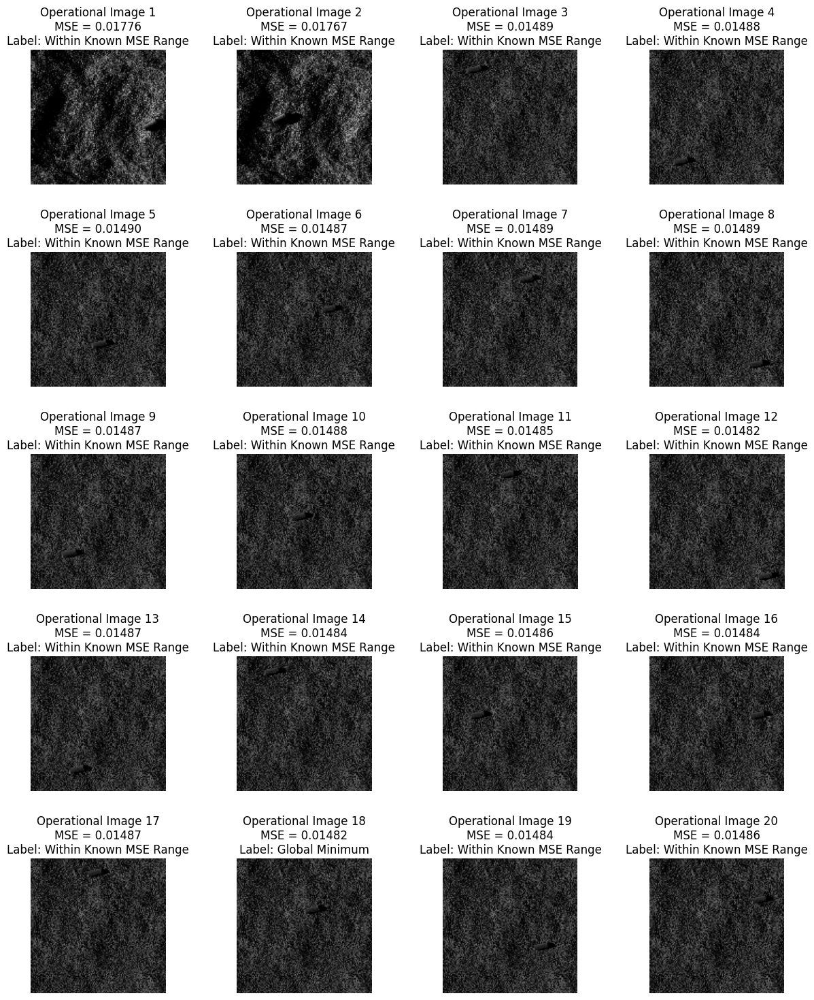

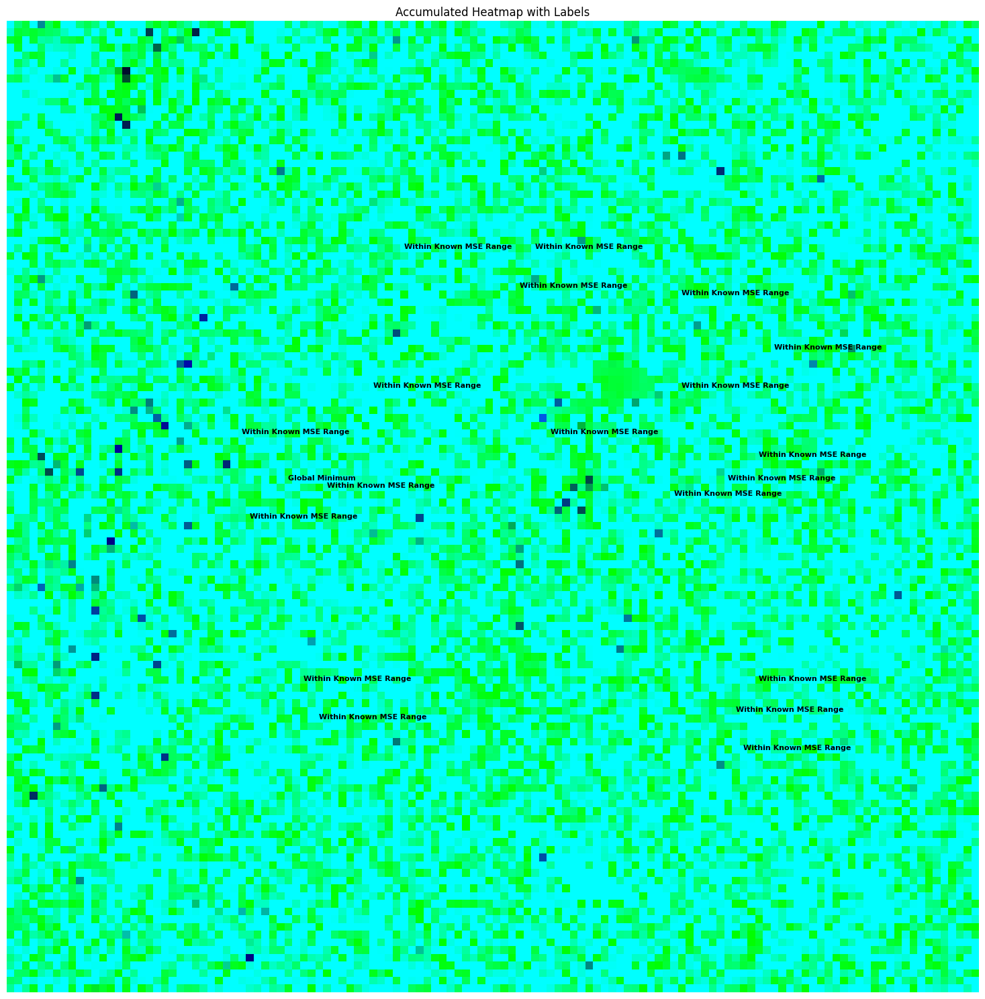

Epoch 1/5
2/2 [==============================] - 2s 279ms/step - loss: 0.4080 - accuracy: 0.5625
Epoch 2/5
2/2 [==============================] - 1s 257ms/step - loss: 7.2421e-04 - accuracy: 1.0000
Epoch 3/5
2/2 [==============================] - 1s 254ms/step - loss: 3.8950e-07 - accuracy: 1.0000
Epoch 4/5
2/2 [==============================] - 1s 275ms/step - loss: 1.2869e-14 - accuracy: 1.0000
Epoch 5/5
1/1 [==============================] - 0s 230ms/step - loss: 17.2386 - accuracy: 0.7500
Test Loss: 17.238588333129883
Test Accuracy: 0.75


In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Load the operational images
operational_images = []
for i in range(20):
    path = "/content/drive/MyDrive/Colab Notebooks/data/operationalimages/" + str(i) + ".png"
    operational_image = tf.keras.preprocessing.image.load_img(path)
    operational_image = tf.keras.preprocessing.image.img_to_array(operational_image)
    operational_image = tf.image.resize(operational_image, (126, 126))
    operational_images.append(operational_image)

operational_images = np.array(operational_images) / 255.0  # Normalize the operational images

# Load the trained DAE
trained_dae = tf.keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/data/models/trained_dae_c1.h5')

# Compute reconstruction errors for each pixel
reconstruction_errors = []
for image in operational_images:
    reconstructed_image = trained_dae.predict(np.expand_dims(image, axis=0))
    mse = np.mean((image - reconstructed_image.squeeze()) ** 2)  # Squeeze the dimensions of the reconstructed image
    reconstruction_errors.append(mse)

reconstruction_errors = np.array(reconstruction_errors)  # Convert to NumPy array

# Criteria
validation_min = 0.014816873706877232  # Minimum MSE value from the validation set
validation_max = 0.017764732241630554  # Maximum MSE value from the validation set
global_min_index = np.argmin(reconstruction_errors)
within_range_indices = np.where((reconstruction_errors >= validation_min) & (reconstruction_errors <= validation_max))[0]
local_minima_indices = [i for i, error in enumerate(reconstruction_errors) if error == min(reconstruction_errors)]

# Assign labels to different regions of the heatmap
labels = []
for i in range(len(operational_images)):
    mse = reconstruction_errors[i]
    if i == global_min_index:
        label = "Global Minimum"
    elif mse >= validation_min and mse <= validation_max:
        label = "Within Known MSE Range"
    elif i in local_minima_indices:
        label = "Local Minimum"
    else:
        label = "Other"
    labels.append(label)

# Display operational images and heatmaps with labels
fig, axs = plt.subplots(5, 4, figsize=(15, 18))
fig.subplots_adjust(hspace=0.5)
axs = axs.ravel()

heatmap = np.zeros((126, 126, 3))  # Initialize the heatmap

for i in range(len(operational_images)):
    axs[i].imshow(operational_images[i])
    axs[i].axis('off')
    axs[i].set_title(f"Operational Image {i+1}\nMSE = {reconstruction_errors[i]:.5f}\nLabel: {labels[i]}")

    # Generate heatmap for the current operational image
    predicted_image = trained_dae.predict(np.expand_dims(operational_images[i], axis=0))
    predicted_image = np.squeeze(predicted_image, axis=0)  # Remove the batch dimension
    predicted_image = predicted_image[:, :, :3]  # Keep only the RGB channels
    mse = np.mean(np.square(operational_images[i] - predicted_image))

    if i == global_min_index:
        color = (0, 0, 255)  # Red color for global minimum
        label_color = (255, 255, 255)  # White color for label text
    elif mse >= validation_min and mse <= validation_max:
        color = (0, 255, 0)  # Green color for within known MSE range
        label_color = (0, 0, 0)  # Black color for label text
    elif i in local_minima_indices:
        color = (255, 0, 0)  # Blue color for local minima
        label_color = (255, 0, 255)  # White color for label text
    else:
        color = (0, 0, 0)  # Black color for other regions
        label_color = (255, 255, 255)  # White color for label text

    heatmap += np.abs(operational_images[i] - predicted_image) * color

# Normalize the accumulated heatmap
heatmap /= len(operational_images)

# Create a larger figure for the heatmap
plt.figure(figsize=(15, 15))

# Display the heatmap with labels
plt.imshow(heatmap, cmap='coolwarm', vmin=0, vmax=1)
plt.axis('off')
plt.title("Accumulated Heatmap with Labels")

# Add labels to the heatmap
for i in range(len(operational_images)):
    label = labels[i]
    x = np.random.randint(30, 100)  # X-coordinate for label
    y = np.random.randint(20, 100)  # Y-coordinate for label
    plt.text(x, y, label, color=label_color, fontsize=8, fontweight='bold')

plt.tight_layout()
plt.show()

# Perform label encoding
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform(labels)

# Split the data into training and testing sets
train_images, test_images, train_labels, test_labels = train_test_split(operational_images, encoded_labels, test_size=0.2, random_state=42)

# Convert the label arrays to TensorFlow tensors
train_labels = tf.convert_to_tensor(train_labels)
test_labels = tf.convert_to_tensor(test_labels)

# Define the model architecture
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(126, 126, 3)),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Train the model
model.fit(train_images, train_labels, epochs=5, batch_size=8)

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_images, test_labels)
print('Test Loss:', test_loss)
print('Test Accuracy:', test_accuracy)
